# Alto-Adige glaciers cadastre EDA

## Data loading and setup

In [ ]:
!pip install geopandas -q

In [ ]:
import geopandas as gpd
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Adjust the base path to where you uploaded the folders in your Drive
BASE = "/content/drive/MyDrive/Colab Notebooks/Dataviz/Project"

FILES = {
    1997: f"{BASE}/SGIhom_1997/SGIhom_1997.shp",
    2005: f"{BASE}/SGIhom_2005/SGIhom_2005.shp",
    2017: f"{BASE}/SGIhom_2017/SGIhom_2017.shp",
}

gdfs = {}
for year, path in FILES.items():
    gdf = gpd.read_file(path)
    gdf["YEAR"] = year
    gdfs[year] = gdf
    print(f"{year}: {len(gdf)} glaciers | CRS: {gdf.crs}")

1997: 325 glaciers | CRS: EPSG:25832
2005: 388 glaciers | CRS: EPSG:25832
2017: 549 glaciers | CRS: EPSG:25832


In [ ]:
for yr in [1997, 2005, 2017]:
       s = gdfs[yr]["AREA_RIL"] if "AREA_RIL" in gdfs[yr].columns else gdfs[yr].geometry.area / 1e6
       print(f"{yr}: total area = {s.sum():.2f}, n = {len(gdfs[yr])}")

1997: total area = 121.90, n = 325
2005: total area = 103.84, n = 388
2017: total area = 83.97, n = 549


In [ ]:
gdfs[2017].columns

Index(['HOM_ID', 'PATCH_17', 'PATCH_05', 'PATCH_97', 'NAME_D', 'NAME_IT',
       'REGION', 'DATE', 'CGI_ID', 'WGMS_ID', 'AREA_17', 'ALT_MIN', 'ALT_MAX',
       'ALT_MEAN', 'ALT_MEDIAN', 'SLOPE_MEAN', 'ASPECT_AZM', 'ASPECT_CLS',
       'X_UTM', 'Y_UTM', 'BOUND_FLG', 'geometry', 'YEAR'],
      dtype='object')

In [ ]:
for yr in [1997, 2005, 2017]:
    print(f"\n{yr}: {gdfs[yr].columns.tolist()}")


1997: ['HOM_ID', 'PATCH_97', 'NAME_D', 'NAME_IT', 'REGION', 'CGI_ID', 'WGMS_ID', 'AREA_97', 'ALT_MIN', 'ALT_MAX', 'ALT_MEAN', 'ALT_MEDIAN', 'SLOPE_MEAN', 'ASPECT_AZM', 'ASPECT_CLS', 'X_UTM', 'Y_UTM', 'BOUND_FLG', 'geometry', 'YEAR']

2005: ['HOM_ID', 'PATCH_05', 'PATCH_97', 'NAME_D', 'NAME_IT', 'REGION', 'CGI_ID', 'WGMS_ID', 'AREA_05', 'ALT_MIN', 'ALT_MAX', 'ALT_MEAN', 'ALT_MEDIAN', 'SLOPE_MEAN', 'ASPECT_AZM', 'ASPECT_CLS', 'X_UTM', 'Y_UTM', 'BOUND_FLG', 'geometry', 'YEAR']

2017: ['HOM_ID', 'PATCH_17', 'PATCH_05', 'PATCH_97', 'NAME_D', 'NAME_IT', 'REGION', 'DATE', 'CGI_ID', 'WGMS_ID', 'AREA_17', 'ALT_MIN', 'ALT_MAX', 'ALT_MEAN', 'ALT_MEDIAN', 'SLOPE_MEAN', 'ASPECT_AZM', 'ASPECT_CLS', 'X_UTM', 'Y_UTM', 'BOUND_FLG', 'geometry', 'YEAR']


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

COLORS = {1997: "#5c0f3b", 2005: "#c44341", 2017: "#ffa600"}
YEARS = [1997, 2005, 2017]

# Area column name per year
AREA_COL = {1997: "AREA_97", 2005: "AREA_05", 2017: "AREA_17"}

## Data quality assessment

In [ ]:
def column_quality(gdf, year):
    rows = []
    n = len(gdf)
    for col in gdf.columns:
        if col in ("geometry", "YEAR"):
            continue
        s = gdf[col]
        n_null = s.isna().sum()
        # detect -9999 / empty-string placeholders
        n_placeholder = 0
        if s.dtype == object:
            n_placeholder = (s.astype(str).str.strip().isin(["-9999", "", "None"])).sum()
        else:
            n_placeholder = (s == -9999).sum()
        rows.append({
            "column": col,
            "dtype": str(s.dtype),
            "n_unique": s.nunique(),
            "%_null": round(n_null / n * 100, 1),
            "%_placeholder": round(n_placeholder / n * 100, 1),
        })
    df = pd.DataFrame(rows)
    df.insert(0, "year", year)
    return df

quality = pd.concat([column_quality(gdfs[yr], yr) for yr in YEARS], ignore_index=True)
quality

,year,column,dtype,n_unique,%_null,%_placeholder
0,1997,HOM_ID,float64,234,0.0,0.0
1,1997,PATCH_97,float64,325,0.0,0.0
2,1997,NAME_D,object,148,17.2,18.5
3,1997,NAME_IT,object,104,35.7,35.7
4,1997,REGION,object,9,0.0,0.0
5,1997,CGI_ID,object,238,11.1,15.4
6,1997,WGMS_ID,object,67,64.6,64.6
7,1997,AREA_97,float64,325,0.0,0.0
8,1997,ALT_MIN,float64,271,0.0,0.0
9,1997,ALT_MAX,float64,283,0.0,0.0


In [ ]:
# Pivot: one row per column, years as grouped sub-columns
compact = quality.pivot(index="column", columns="year",
                        values=["%_null", "%_placeholder"])

# Reorder so it reads metric → year, and sort columns by original order
compact = compact.swaplevel(axis=1).sort_index(axis=1, level=0)

# Optional: restore the original column order (not alphabetical)
col_order = quality[quality["year"] == 2017]["column"].tolist()
# 2017 has the most columns; fall back to union if needed
col_order = quality.drop_duplicates("column")["column"].tolist()
compact = compact.reindex(col_order)

compact

year         1997                 2005                 2017              
           %_null %_placeholder %_null %_placeholder %_null %_placeholder
column                                                                   
HOM_ID        0.0           0.0    0.0           0.0    0.0           0.0
PATCH_97      0.0           0.0    0.0           0.0    0.0           0.0
NAME_D       17.2          18.5   14.4          14.4    4.4           4.4
NAME_IT      35.7          35.7   34.8          34.8   23.7          23.7
REGION        0.0           0.0    0.0           0.0    0.0           0.0
CGI_ID       11.1          15.4    0.0          11.6    0.0           6.0
WGMS_ID      64.6          64.6   61.6          61.6   57.6          57.6
AREA_97       0.0           0.0    NaN           NaN    NaN           NaN
ALT_MIN       0.0           0.0    0.0           4.1    0.0           0.9
ALT_MAX       0.0           0.0    0.0           4.1    0.0           0.9
ALT_MEAN      0.0           0.0    0.0           4.1    0.0           0.9
ALT_MEDIAN    0.0           0.0    0.0           4.1    0.0           0.9
SLOPE_MEAN    0.0           0.0    0.0           4.1    0.0           0.9
ASPECT_AZM    0.0           0.0    0.0           4.1    0.0           0.9
ASPECT_CLS    0.0           0.0    0.0           4.1    0.0           0.9
X_UTM         0.0           0.0    0.0           0.0    0.0           0.0
Y_UTM         0.0           0.0    0.0           0.0    0.0           0.0
BOUND_FLG     0.0           0.0    0.0           0.0    0.0           0.0
PATCH_05      NaN           NaN    0.0           0.0    0.0           0.0
AREA_05       NaN           NaN    0.0           0.0    NaN           NaN
PATCH_17      NaN           NaN    NaN           NaN    0.0           0.0
DATE          NaN           NaN    NaN           NaN    0.0           0.0
AREA_17       NaN           NaN    NaN           NaN    0.0           0.0

Replacing the -9999 placehoders with NaNs

In [ ]:
import numpy as np

for yr in YEARS:
    g = gdfs[yr]
    # Replace -9999 in numeric columns with NaN
    num_cols = ["ALT_MIN", "ALT_MAX", "ALT_MEAN", "ALT_MEDIAN",
                "SLOPE_MEAN", "ASPECT_AZM", "X_UTM", "Y_UTM"]
    g[num_cols] = g[num_cols].replace(-9999, np.nan)
    # Replace placeholder strings in text columns with NaN
    str_cols = ["CGI_ID", "WGMS_ID", "NAME_D", "NAME_IT"]
    for c in str_cols:
        if c in g.columns:
            g[c] = g[c].replace(["-9999", "", "None"], np.nan)
    gdfs[yr] = g

In [ ]:
for yr in YEARS:
    g = gdfs[yr]
    bad_order = (~(g["ALT_MIN"] <= g["ALT_MEDIAN"])) | (~(g["ALT_MEDIAN"] <= g["ALT_MAX"]))
    mean_check = ((g["ALT_MIN"] + g["ALT_MAX"]) / 2 - g["ALT_MEAN"]).abs() > 1
    print(f"{yr}: {bad_order.sum()} rows violate MIN≤MEDIAN≤MAX, "
          f"{mean_check.sum()} rows where ALT_MEAN ≠ (MIN+MAX)/2")

1997: 0 rows violate MIN≤MEDIAN≤MAX, 291 rows where ALT_MEAN ≠ (MIN+MAX)/2
2005: 16 rows violate MIN≤MEDIAN≤MAX, 330 rows where ALT_MEAN ≠ (MIN+MAX)/2
2017: 5 rows violate MIN≤MEDIAN≤MAX, 394 rows where ALT_MEAN ≠ (MIN+MAX)/2


In [ ]:
for yr in YEARS:
    g = gdfs[yr]
    computed = g.geometry.area / 1e6   # m² → km² (CRS is metric, EPSG:25832)
    diff_pct = ((computed - g[AREA_COL[yr]]) / g[AREA_COL[yr]] * 100).abs()
    print(f"{yr}: median |diff| = {diff_pct.median():.2f}%, "
          f"max |diff| = {diff_pct.max():.2f}%, "
          f"rows >5% off = {(diff_pct > 5).sum()}")

1997: median |diff| = 0.00%, max |diff| = 0.00%, rows >5% off = 0
2005: median |diff| = 0.00%, max |diff| = 0.00%, rows >5% off = 0
2017: median |diff| = 0.00%, max |diff| = 0.00%, rows >5% off = 0


In [ ]:
for yr in YEARS:
    g = gdfs[yr]
    print(f"{yr}: {(~g.geometry.is_valid).sum()} invalid, "
          f"{g.geometry.is_empty.sum()} empty, "
          f"{g.geometry.duplicated().sum()} duplicate geometries")

1997: 0 invalid, 0 empty, 0 duplicate geometries
2005: 0 invalid, 0 empty, 0 duplicate geometries
2017: 2 invalid, 0 empty, 0 duplicate geometries


In [ ]:
for yr in YEARS:
    g = gdfs[yr]
    print(f"\n{yr}:")
    print(f"  ASPECT_AZM range: {g['ASPECT_AZM'].min():.0f}–{g['ASPECT_AZM'].max():.0f} "
          f"(expect 0–360), nulls: {g['ASPECT_AZM'].isna().sum()}")
    print(f"  SLOPE_MEAN range: {g['SLOPE_MEAN'].min():.1f}–{g['SLOPE_MEAN'].max():.1f}° "
          f"(expect ~0–60), nulls: {g['SLOPE_MEAN'].isna().sum()}")


1997:
  ASPECT_AZM range: 0–360 (expect 0–360), nulls: 0
  SLOPE_MEAN range: 4.0–49.0° (expect ~0–60), nulls: 0

2005:
  ASPECT_AZM range: 1–360 (expect 0–360), nulls: 16
  SLOPE_MEAN range: 9.0–52.0° (expect ~0–60), nulls: 16

2017:
  ASPECT_AZM range: 1–360 (expect 0–360), nulls: 5
  SLOPE_MEAN range: 7.0–50.0° (expect ~0–60), nulls: 5


In [ ]:
hom = {yr: set(gdfs[yr]["HOM_ID"].unique()) for yr in YEARS}
all3 = hom[1997] & hom[2005] & hom[2017]
print(f"HOM_IDs in all 3 years : {len(all3)}")
print(f"In 1997 not in 2017    : {len(hom[1997] - hom[2017])}")
print(f"In 2017 not in 1997    : {len(hom[2017] - hom[1997])}")  # 'new' glaciers (likely fragments w/ new IDs)
print(f"Only in 2005           : {len(hom[2005] - hom[1997] - hom[2017])}")

HOM_IDs in all 3 years : 204
In 1997 not in 2017    : 30
In 2017 not in 1997    : 0
Only in 2005           : 0


## Section A

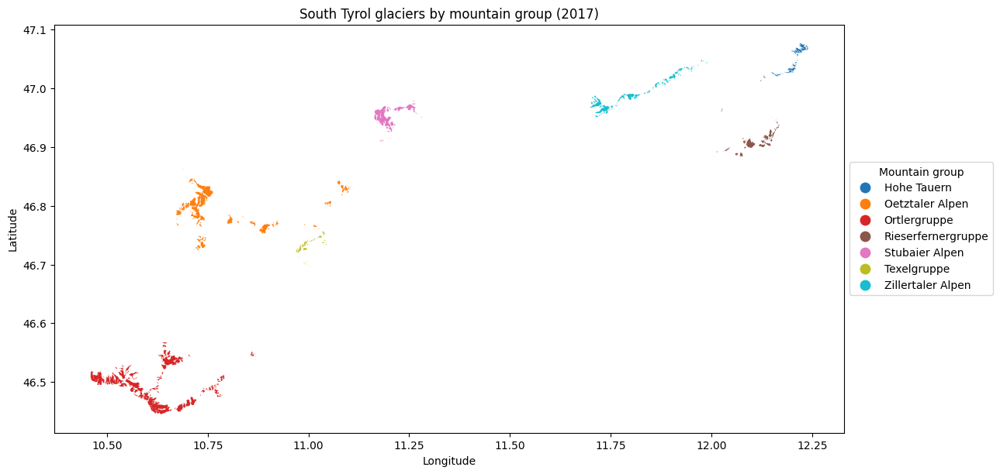

In [ ]:
fig, ax = plt.subplots(figsize=(13, 9))
gdfs[2017].to_crs("EPSG:4326").plot(
    ax=ax, column="REGION", legend=True, cmap="tab10",
    edgecolor="none",
    legend_kwds={"loc": "center left", "bbox_to_anchor": (1, 0.5),
                 "title": "Mountain group"}
)
ax.set_title("South Tyrol glaciers by mountain group (2017)")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

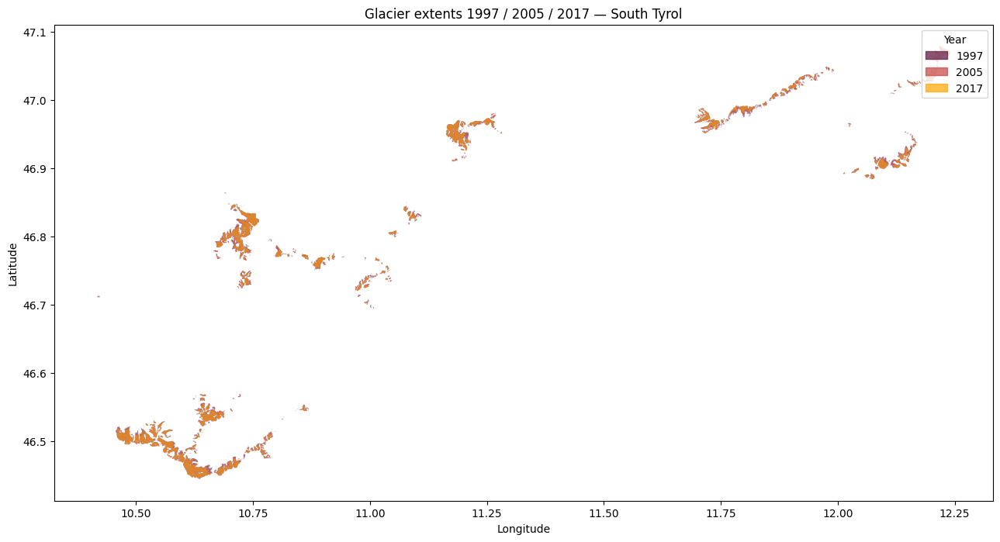

In [ ]:
fig, ax = plt.subplots(figsize=(13, 9))
for yr in YEARS:
    gdfs[yr].to_crs("EPSG:4326").plot(
        ax=ax, color=COLORS[yr], alpha=0.55, edgecolor="none"
    )

handles = [mpatches.Patch(color=COLORS[yr], label=str(yr), alpha=0.7) for yr in YEARS]
ax.legend(handles=handles, title="Year", loc="upper right")
ax.set_title("Glacier extents 1997 / 2005 / 2017 — South Tyrol")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
print(gdfs[2017]["REGION"].value_counts())

REGION
Zillertaler Alpen     151
Ortlergruppe          116
Oetztaler Alpen        92
Hohe Tauern            52
Rieserfernergruppe     51
Stubaier Alpen         50
Texelgruppe            37
Name: count, dtype: int64


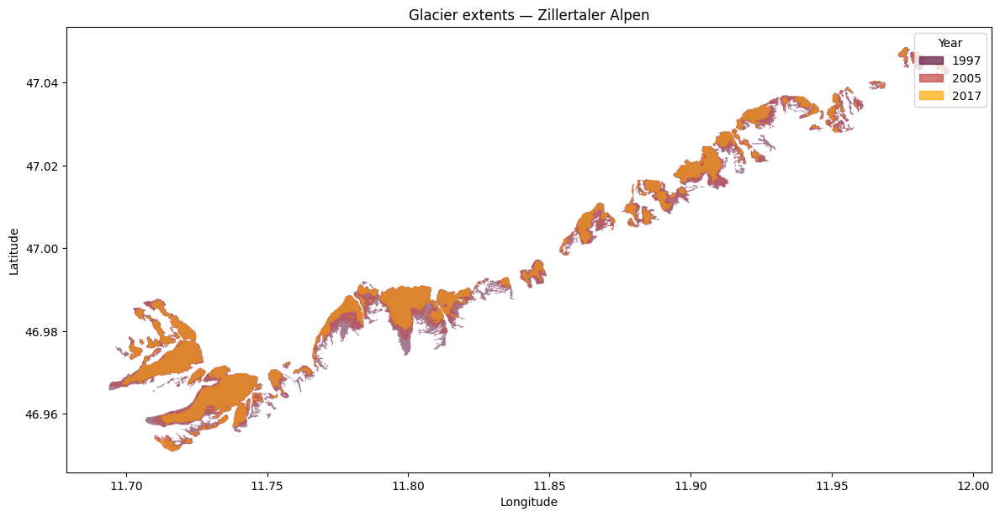

In [ ]:
# PUT IN DEL 2
REGION = "Zillertaler Alpen"   # the largest glacierized region per the paper

fig, ax = plt.subplots(figsize=(12, 10))
for yr in YEARS:
    subset = gdfs[yr][gdfs[yr]["REGION"] == REGION].to_crs("EPSG:4326")
    subset.plot(ax=ax, color=COLORS[yr], alpha=0.55, edgecolor="none")

handles = [mpatches.Patch(color=COLORS[yr], label=str(yr), alpha=0.7) for yr in YEARS]
ax.legend(handles=handles, title="Year")
ax.set_title(f"Glacier extents — {REGION}")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

## Section B

In [ ]:
gdfs[2017].columns

Index(['HOM_ID', 'PATCH_17', 'PATCH_05', 'PATCH_97', 'NAME_D', 'NAME_IT',
       'REGION', 'DATE', 'CGI_ID', 'WGMS_ID', 'AREA_17', 'ALT_MIN', 'ALT_MAX',
       'ALT_MEAN', 'ALT_MEDIAN', 'SLOPE_MEAN', 'ASPECT_AZM', 'ASPECT_CLS',
       'X_UTM', 'Y_UTM', 'BOUND_FLG', 'geometry', 'YEAR'],
      dtype='object')

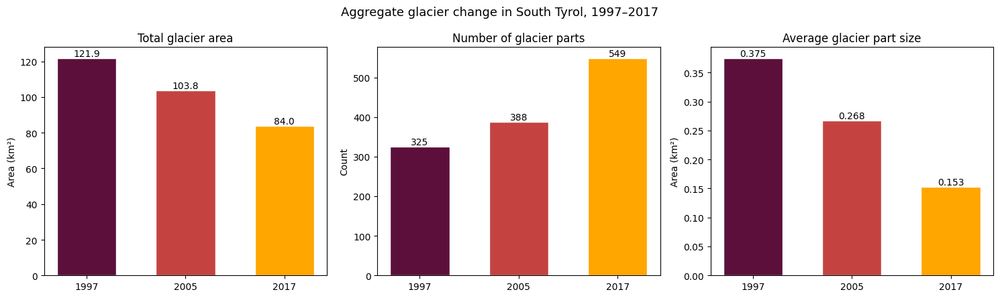

In [ ]:
# PUT IN DEL 2
totals = [gdfs[yr][AREA_COL[yr]].sum() for yr in YEARS] # sum of area
counts = [len(gdfs[yr]) for yr in YEARS] # number of glaciers
means  = [gdfs[yr][AREA_COL[yr]].mean() for yr in YEARS] # avg area of glaciers

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
labels = [str(y) for y in YEARS]
bar_colors = [COLORS[y] for y in YEARS]

# Total area
axes[0].bar(labels, totals, color=bar_colors, edgecolor="white", width=0.6)
axes[0].set_title("Total glacier area")
axes[0].set_ylabel("Area (km²)")
for i, v in enumerate(totals):
    axes[0].text(i, v, f"{v:.1f}", ha="center", va="bottom")

# Number of parts
axes[1].bar(labels, counts, color=bar_colors, edgecolor="white", width=0.6)
axes[1].set_title("Number of glacier parts")
axes[1].set_ylabel("Count")
for i, v in enumerate(counts):
    axes[1].text(i, v, str(v), ha="center", va="bottom")

# Average size
axes[2].bar(labels, means, color=bar_colors, edgecolor="white", width=0.6)
axes[2].set_title("Average glacier part size")
axes[2].set_ylabel("Area (km²)")
for i, v in enumerate(means):
    axes[2].text(i, v, f"{v:.3f}", ha="center", va="bottom")

fig.suptitle("Aggregate glacier change in South Tyrol, 1997–2017", fontsize=13)
plt.tight_layout()
plt.show()

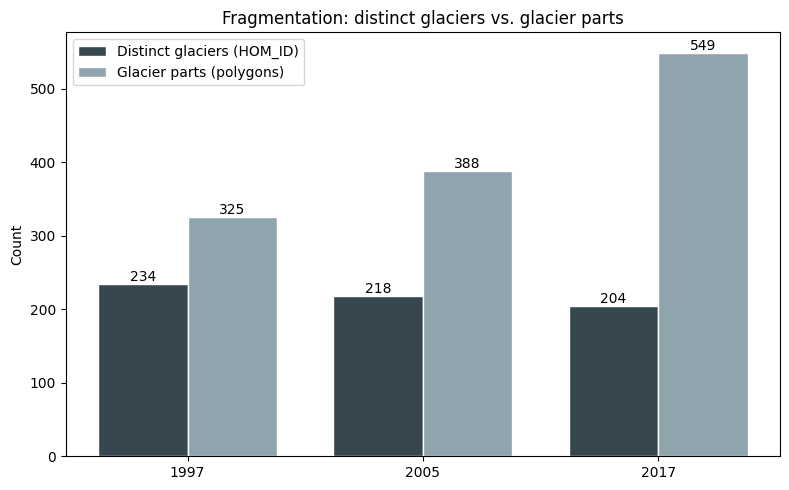

In [ ]:
# PUT IN DEL 2?
n_parts    = [len(gdfs[yr]) for yr in YEARS]
n_glaciers = [gdfs[yr]["HOM_ID"].nunique() for yr in YEARS]

x = range(len(YEARS))
w = 0.38

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar([i - w/2 for i in x], n_glaciers, width=w,
       label="Distinct glaciers (HOM_ID)", color="#37474F", edgecolor="white")
ax.bar([i + w/2 for i in x], n_parts, width=w,
       label="Glacier parts (polygons)", color="#90A4AE", edgecolor="white")

ax.set_xticks(list(x))
ax.set_xticklabels([str(y) for y in YEARS])
ax.set_ylabel("Count")
ax.set_title("Fragmentation: distinct glaciers vs. glacier parts")
ax.legend()

for i in x:
    ax.text(i - w/2, n_glaciers[i], str(n_glaciers[i]), ha="center", va="bottom")
    ax.text(i + w/2, n_parts[i], str(n_parts[i]), ha="center", va="bottom")

plt.tight_layout()
plt.show()

## Section C

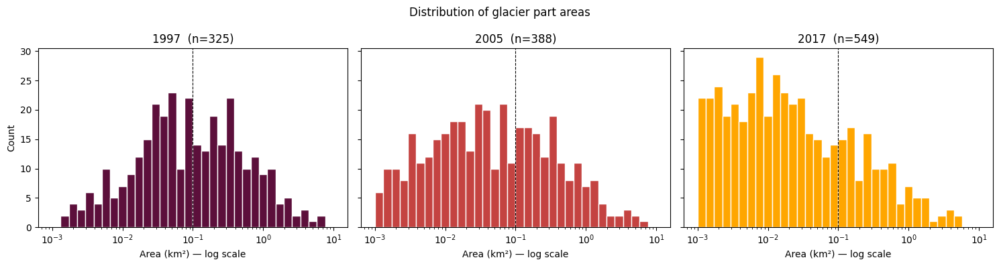

In [ ]:
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
bins = np.logspace(np.log10(1e-3), np.log10(10), 35)

for ax, yr in zip(axes, YEARS):
    ax.hist(gdfs[yr][AREA_COL[yr]], bins=bins, color=COLORS[yr], edgecolor="white")
    ax.set_xscale("log")
    ax.set_xlabel("Area (km²) — log scale")
    ax.axvline(0.1, color="black", ls="--", lw=0.8)  # 0.1 km² reference line
    ax.set_title(f"{yr}  (n={len(gdfs[yr])})")
axes[0].set_ylabel("Count")
fig.suptitle("Distribution of glacier part areas")
plt.tight_layout()
plt.show()

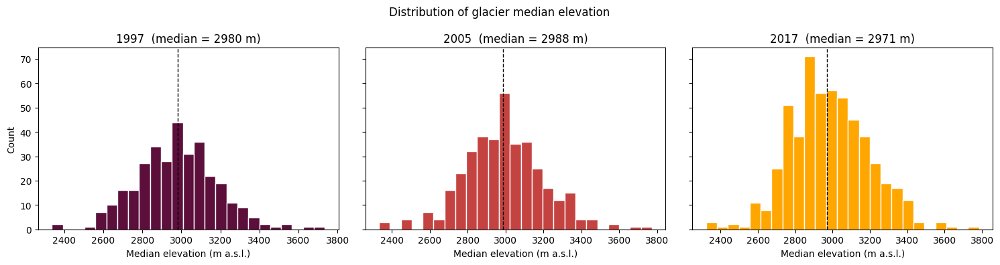

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for ax, yr in zip(axes, YEARS):
    valid = gdfs[yr][gdfs[yr]["ALT_MEDIAN"] > 0]["ALT_MEDIAN"]
    ax.hist(valid, bins=25, color=COLORS[yr], edgecolor="white")
    ax.axvline(valid.median(), color="black", ls="--", lw=1)
    ax.set_xlabel("Median elevation (m a.s.l.)")
    ax.set_title(f"{yr}  (median = {valid.median():.0f} m)")
axes[0].set_ylabel("Count")
fig.suptitle("Distribution of glacier median elevation")
plt.tight_layout()
plt.show()

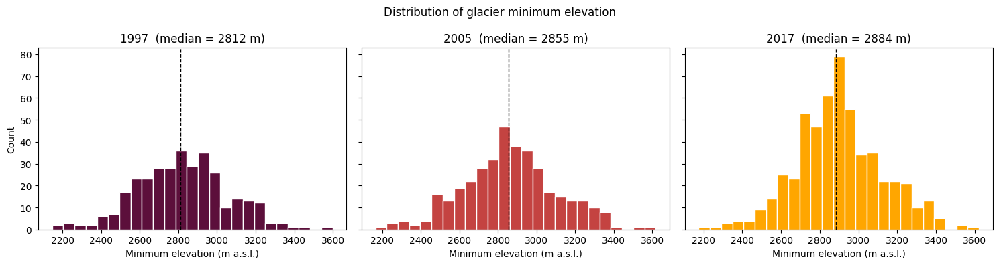

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for ax, yr in zip(axes, YEARS):
    valid = gdfs[yr][gdfs[yr]["ALT_MIN"] > 0]["ALT_MIN"]
    ax.hist(valid, bins=25, color=COLORS[yr], edgecolor="white")
    ax.axvline(valid.median(), color="black", ls="--", lw=1)
    ax.set_xlabel("Minimum elevation (m a.s.l.)")
    ax.set_title(f"{yr}  (median = {valid.median():.0f} m)")
axes[0].set_ylabel("Count")
fig.suptitle("Distribution of glacier minimum elevation")
plt.tight_layout()
plt.show()

In [ ]:
def area_weighted_mean_alt(gdf, area_col):
    valid = gdf[gdf["ALT_MEDIAN"] > 0]
    return np.average(valid["ALT_MEDIAN"], weights=valid[area_col])

for yr in YEARS:
    awm = area_weighted_mean_alt(gdfs[yr], AREA_COL[yr])
    print(f"{yr}: area-weighted mean of median elevation = {awm:.0f} m")

1997: area-weighted mean of median elevation = 3010 m
2005: area-weighted mean of median elevation = 3020 m
2017: area-weighted mean of median elevation = 3041 m


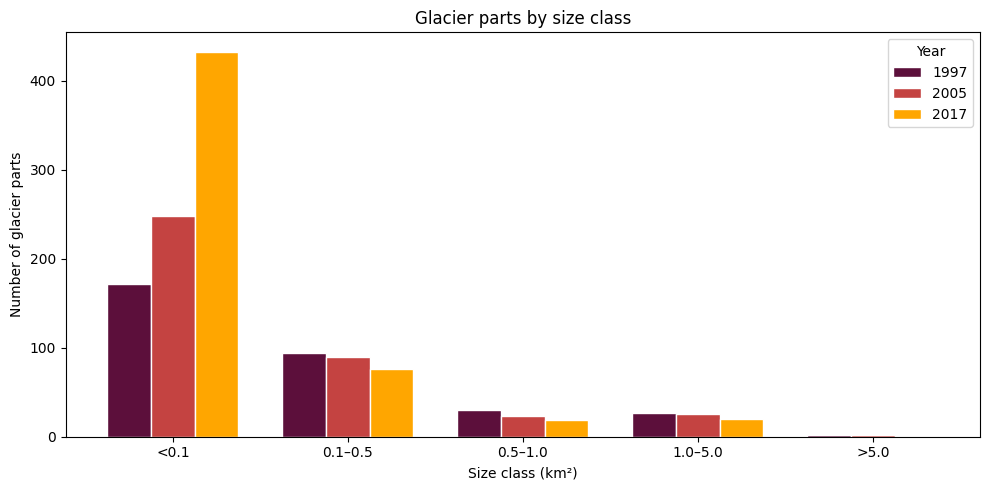

In [ ]:
# Define size classes from the paper
bins_sz = [0, 0.1, 0.5, 1.0, 5.0, np.inf]
labels_sz = ["<0.1", "0.1–0.5", "0.5–1.0", "1.0–5.0", ">5.0"]

class_counts = {}
for yr in YEARS:
    cats = pd.cut(gdfs[yr][AREA_COL[yr]], bins=bins_sz, labels=labels_sz, right=False)
    class_counts[yr] = cats.value_counts().reindex(labels_sz)

counts_df = pd.DataFrame(class_counts)

x = np.arange(len(labels_sz))
w = 0.25
fig, ax = plt.subplots(figsize=(10, 5))
for i, yr in enumerate(YEARS):
    ax.bar(x + (i - 1) * w, counts_df[yr], width=w,
           label=str(yr), color=COLORS[yr], edgecolor="white")

ax.set_xticks(x)
ax.set_xticklabels(labels_sz)
ax.set_xlabel("Size class (km²)")
ax.set_ylabel("Number of glacier parts")
ax.set_title("Glacier parts by size class")
ax.legend(title="Year")
plt.tight_layout()
plt.show()

## Section D

Total area by region, grouped by year (replicates Table 1)

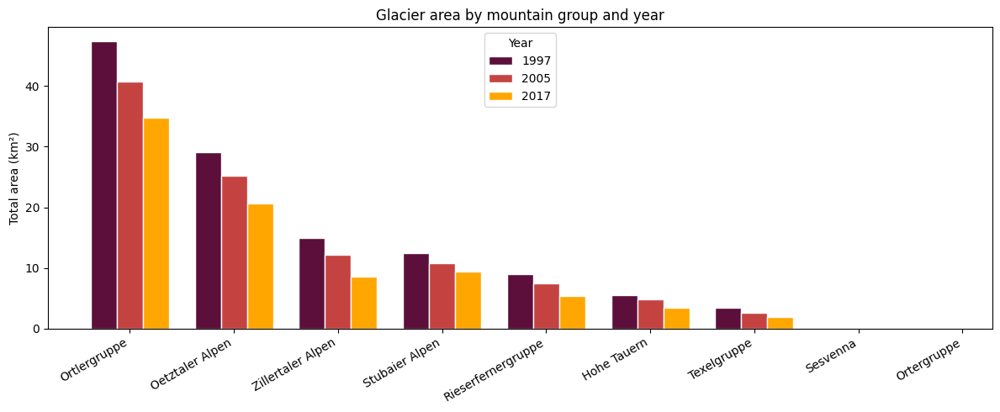

                    1997  2005  2017
REGION                              
Ortlergruppe        47.3  40.7  34.8
Oetztaler Alpen     29.1  25.3  20.6
Zillertaler Alpen   15.0  12.2   8.5
Stubaier Alpen      12.4  10.8   9.4
Rieserfernergruppe   9.0   7.4   5.3
Hohe Tauern          5.6   4.8   3.4
Texelgruppe          3.4   2.6   1.9
Sesvenna             0.1   NaN   NaN
Ortergruppe          0.0   NaN   NaN


In [ ]:
region_area = {}
for yr in YEARS:
    region_area[yr] = gdfs[yr].groupby("REGION")[AREA_COL[yr]].sum()

area_df = pd.DataFrame(region_area)
# Order regions by 1997 area, largest first
area_df = area_df.sort_values(1997, ascending=False)

x = np.arange(len(area_df))
w = 0.25
fig, ax = plt.subplots(figsize=(12, 5))
for i, yr in enumerate(YEARS):
    ax.bar(x + (i - 1) * w, area_df[yr], width=w,
           label=str(yr), color=COLORS[yr], edgecolor="white")

ax.set_xticks(x)
ax.set_xticklabels(area_df.index, rotation=30, ha="right")
ax.set_ylabel("Total area (km²)")
ax.set_title("Glacier area by mountain group and year")
ax.legend(title="Year")
plt.tight_layout()
plt.show()

print(area_df.round(1))

Relative area loss 1997→2017 by region (replicates Fig. 3)

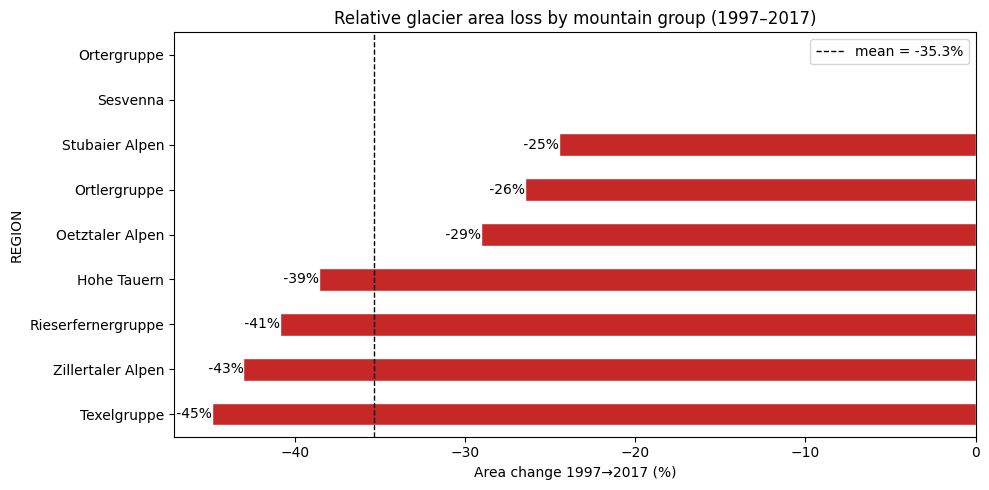

In [ ]:
# PUT IN DEL 2?
loss_pct = ((area_df[2017] - area_df[1997]) / area_df[1997] * 100).sort_values()

fig, ax = plt.subplots(figsize=(10, 5))
loss_pct.plot(kind="barh", ax=ax, color="#C62828", edgecolor="white")
ax.set_xlabel("Area change 1997→2017 (%)")
ax.set_title("Relative glacier area loss by mountain group (1997–2017)")
ax.axvline(loss_pct.mean(), color="black", ls="--", lw=1,
           label=f"mean = {loss_pct.mean():.1f}%")
ax.legend()
for i, v in enumerate(loss_pct):
    ax.text(v, i, f" {v:.0f}%", va="center",
            ha="right" if v < 0 else "left")
plt.tight_layout()
plt.show()

Subperiod comparison: 1997→2005 vs 2005→2017 (replicates Table 2)

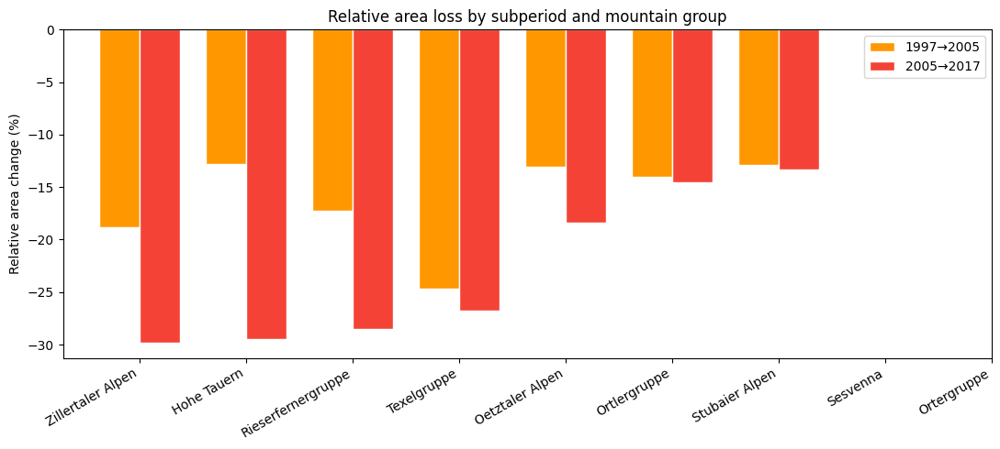

In [ ]:
loss_p1 = (area_df[2005] - area_df[1997]) / area_df[1997] * 100
loss_p2 = (area_df[2017] - area_df[2005]) / area_df[2005] * 100

comp = pd.DataFrame({"1997→2005": loss_p1, "2005→2017": loss_p2})
comp = comp.sort_values("2005→2017")

x = np.arange(len(comp))
w = 0.38
fig, ax = plt.subplots(figsize=(11, 5))
ax.bar(x - w/2, comp["1997→2005"], width=w, label="1997→2005",
       color="#FF9800", edgecolor="white")
ax.bar(x + w/2, comp["2005→2017"], width=w, label="2005→2017",
       color="#F44336", edgecolor="white")

ax.set_xticks(x)
ax.set_xticklabels(comp.index, rotation=30, ha="right")
ax.set_ylabel("Relative area change (%)")
ax.set_title("Relative area loss by subperiod and mountain group")
ax.axhline(0, color="black", lw=0.8)
ax.legend()
plt.tight_layout()
plt.show()

## Section E

In [ ]:
# Aggregate parts to whole glaciers (by HOM_ID) for each year
def aggregate_by_glacier(gdf, area_col):
    return gdf.groupby("HOM_ID").agg(
        area=(area_col, "sum"),
        n_parts=(area_col, "size"),
        alt_median=("ALT_MEDIAN", "median"),
        alt_min=("ALT_MIN", "min"),
        alt_max=("ALT_MAX", "max"),
        region=("REGION", "first"),
        name=("NAME_D", "first"),
        aspect=("ASPECT_CLS", "first"),
    )

agg = {yr: aggregate_by_glacier(gdfs[yr], AREA_COL[yr]) for yr in YEARS}

for yr in YEARS:
    print(f"{yr}: {len(agg[yr])} distinct glaciers, "
          f"total area = {agg[yr]['area'].sum():.1f} km²")

1997: 234 distinct glaciers, total area = 121.9 km²
2005: 218 distinct glaciers, total area = 103.8 km²
2017: 204 distinct glaciers, total area = 84.0 km²


In [ ]:
# Join 1997 and 2017 on HOM_ID — only glaciers present in both
merged = agg[1997][["area", "region", "name", "alt_median"]].join(
    agg[2017][["area"]], lsuffix="_97", rsuffix="_17", how="inner"
)
merged.columns = ["area_97", "region", "name", "alt_median_97", "area_17"]

merged["change_abs"] = merged["area_17"] - merged["area_97"]
merged["change_pct"] = merged["change_abs"] / merged["area_97"] * 100

print(f"Glaciers present in both 1997 and 2017: {len(merged)}")
print("\nLargest relative losses:")
print(merged.sort_values("change_pct")[["name", "region", "area_97", "area_17", "change_pct"]].head(10).round(3))

Glaciers present in both 1997 and 2017: 204

Largest relative losses:
                      name              region  area_97  area_17  change_pct
HOM_ID                                                                      
78.0                  None     Oetztaler Alpen    0.034    0.001     -98.002
143.0           Hochferner      Stubaier Alpen    0.078    0.005     -94.193
168.0         Gliderferner   Zillertaler Alpen    0.030    0.002     -94.151
95.0                  None     Oetztaler Alpen    0.078    0.005     -93.070
230.0         Muklarferner  Rieserfernergruppe    0.128    0.010     -92.213
76.0                  None     Oetztaler Alpen    0.133    0.015     -88.674
123.0     Blaulackenferner         Texelgruppe    0.106    0.012     -88.655
48.0    Saellentjochferner        Ortlergruppe    0.180    0.021     -88.299
121.0       Lahnbachferner         Texelgruppe    0.061    0.007     -88.196
149.0                 None      Stubaier Alpen    0.027    0.004     -86.346


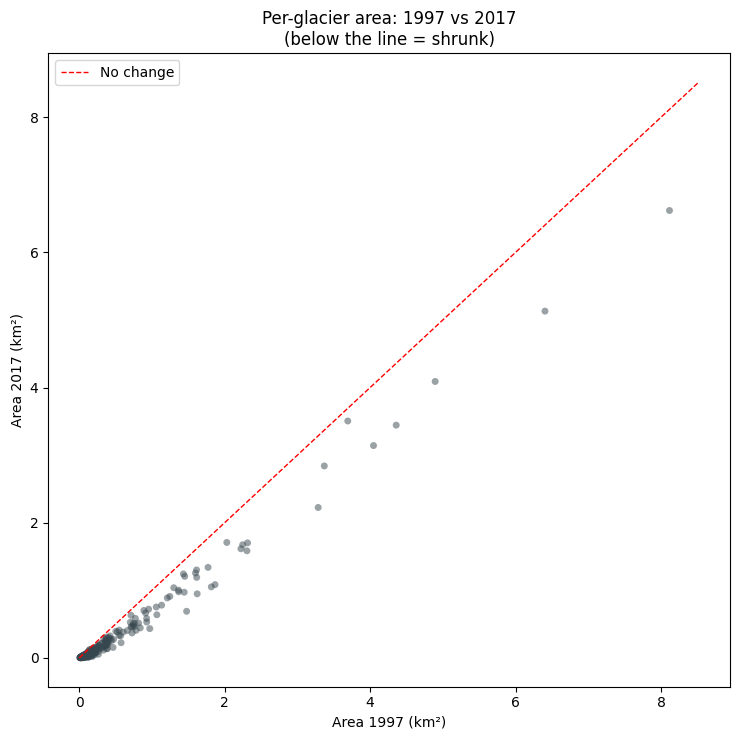

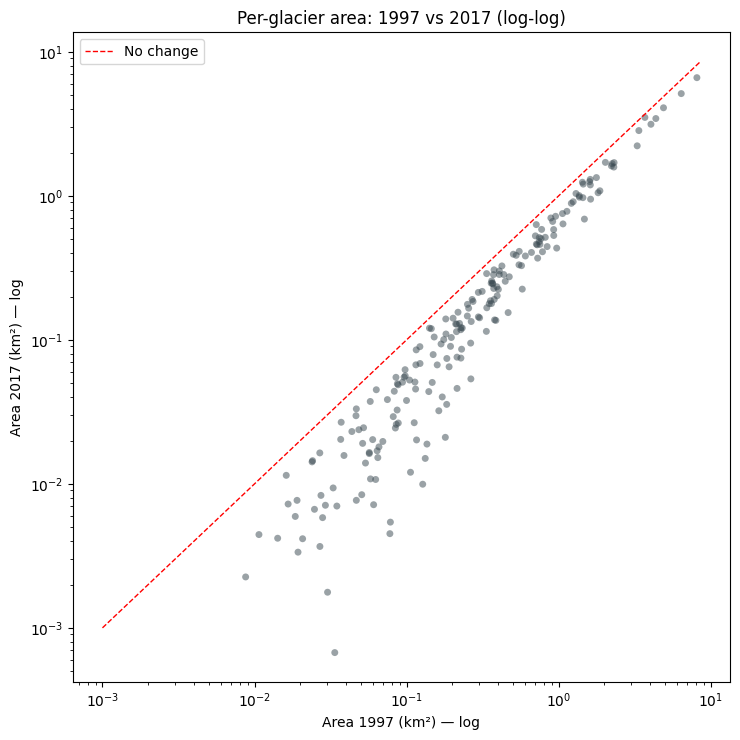

In [ ]:
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.scatter(merged["area_97"], merged["area_17"],
           alpha=0.5, s=25, color="#37474F", edgecolors="none")
lim = merged["area_97"].max() * 1.05
ax.plot([0, lim], [0, lim], "r--", lw=1, label="No change")
ax.set_xlabel("Area 1997 (km²)")
ax.set_ylabel("Area 2017 (km²)")
ax.set_title("Per-glacier area: 1997 vs 2017\n(below the line = shrunk)")
ax.legend()
plt.tight_layout()
plt.show()

# log-log version to see small glaciers clearly
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.scatter(merged["area_97"], merged["area_17"],
           alpha=0.5, s=25, color="#37474F", edgecolors="none")
ax.plot([1e-3, lim], [1e-3, lim], "r--", lw=1, label="No change")
ax.set_xscale("log"); ax.set_yscale("log")
ax.set_xlabel("Area 1997 (km²) — log")
ax.set_ylabel("Area 2017 (km²) — log")
ax.set_title("Per-glacier area: 1997 vs 2017 (log-log)")
ax.legend()
plt.tight_layout()
plt.show()

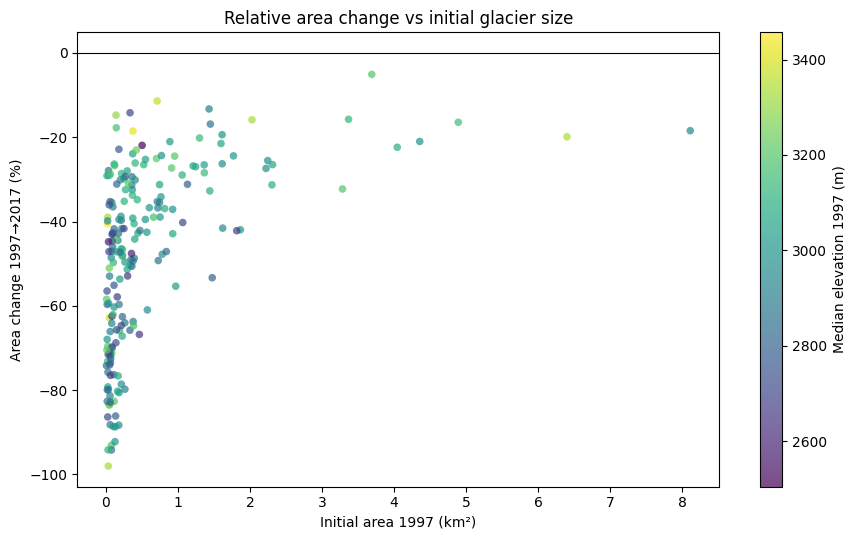

In [ ]:
fig, ax = plt.subplots(figsize=(9, 5.5))
sc = ax.scatter(merged["area_97"], merged["change_pct"],
                c=merged["alt_median_97"], cmap="viridis",
                alpha=0.7, s=30, edgecolors="none")
ax.axhline(0, color="black", lw=0.8)
ax.set_xlabel("Initial area 1997 (km²)")
ax.set_ylabel("Area change 1997→2017 (%)")
ax.set_title("Relative area change vs initial glacier size")
cbar = plt.colorbar(sc)
cbar.set_label("Median elevation 1997 (m)")
plt.tight_layout()
plt.show()

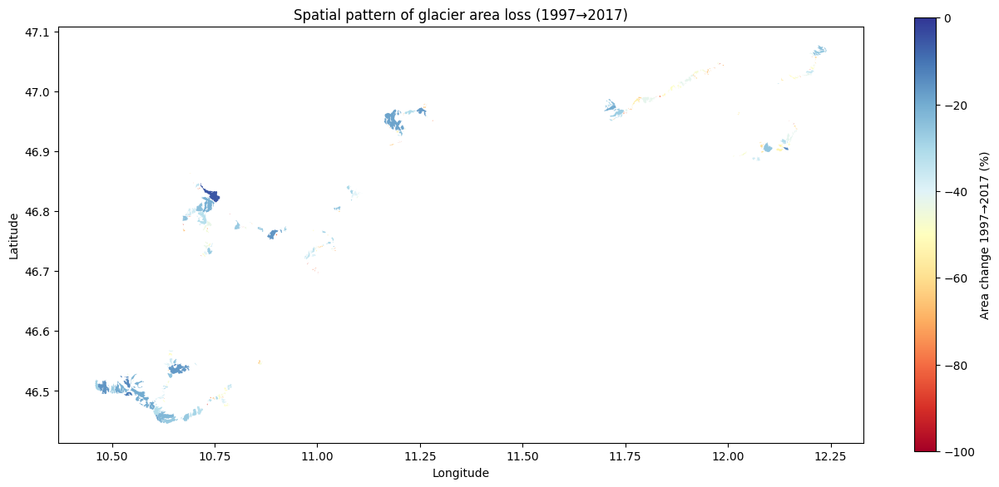

In [ ]:
# Attach change_pct to 2017 geometries via HOM_ID, dissolve parts into one shape per glacier
geom_17 = gdfs[2017].dissolve(by="HOM_ID")[["geometry"]]
map_df = geom_17.join(merged["change_pct"], how="inner")
map_df = gpd.GeoDataFrame(map_df, geometry="geometry", crs=gdfs[2017].crs).to_crs("EPSG:4326")

fig, ax = plt.subplots(figsize=(13, 9))
map_df.plot(ax=ax, column="change_pct", cmap="RdYlBu", legend=True,
            vmin=-100, vmax=0, edgecolor="none",
            legend_kwds={"label": "Area change 1997→2017 (%)", "shrink": 0.6})
ax.set_title("Spatial pattern of glacier area loss (1997→2017)")
ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
!pip install folium mapclassify -q

In [ ]:
# Build per-glacier geometries with change_pct (same as before)
geom_17 = gdfs[2017].dissolve(by="HOM_ID")[["geometry"]]
map_df = geom_17.join(
    merged[["change_pct", "area_97", "area_17", "name", "region"]], how="inner"
)
map_df = gpd.GeoDataFrame(map_df, geometry="geometry", crs=gdfs[2017].crs)

# .explore() reprojects to WGS84 automatically, but doing it explicitly is safe
m = map_df.to_crs("EPSG:4326").explore(
    column="change_pct",
    cmap="RdYlBu",
    vmin=-100, vmax=0,
    legend=True,
    tooltip=["name", "region", "area_97", "area_17", "change_pct"],
    tiles="CartoDB positron",          # clean light basemap
    style_kwds={"weight": 0.5, "fillOpacity": 0.8},
    legend_kwds={"caption": "Area change 1997→2017 (%)"},
    name="Glacier area change",
)
m   # displays inline in Colab

## Section F

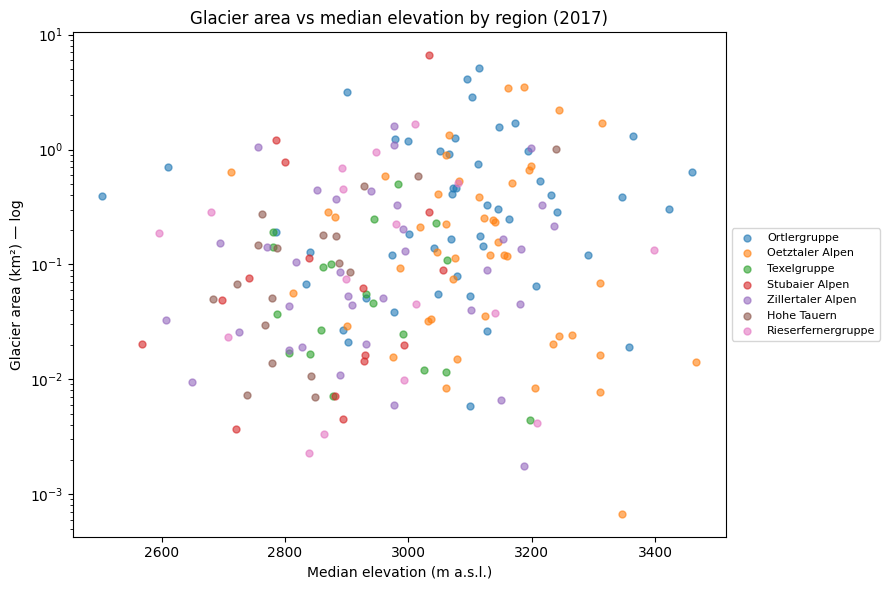

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
for region in agg[2017]["region"].unique():
    sub = agg[2017][agg[2017]["region"] == region]
    ax.scatter(sub["alt_median"], sub["area"], label=region, alpha=0.6, s=25)
ax.set_yscale("log")
ax.set_xlabel("Median elevation (m a.s.l.)")
ax.set_ylabel("Glacier area (km²) — log")
ax.set_title("Glacier area vs median elevation by region (2017)")
ax.legend(fontsize=8, loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

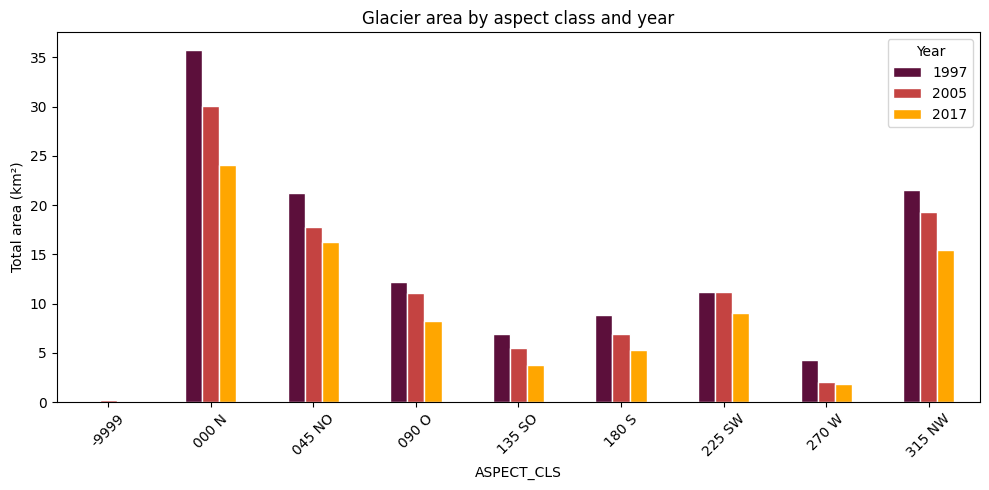

In [ ]:
aspect_area = {}
for yr in YEARS:
    aspect_area[yr] = gdfs[yr].groupby("ASPECT_CLS")[AREA_COL[yr]].sum()
asp_df = pd.DataFrame(aspect_area).fillna(0)

asp_df.plot(kind="bar", figsize=(10, 5),
            color=[COLORS[y] for y in YEARS], edgecolor="white")
plt.ylabel("Total area (km²)")
plt.title("Glacier area by aspect class and year")
plt.xticks(rotation=45)
plt.legend(title="Year")
plt.tight_layout()
plt.show()

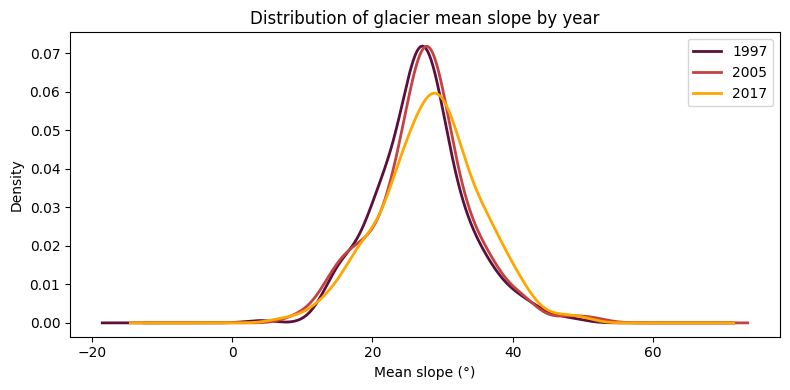

In [ ]:
fig, ax = plt.subplots(figsize=(8, 4))
for yr in YEARS:
    valid = gdfs[yr][gdfs[yr]["SLOPE_MEAN"] > 0]["SLOPE_MEAN"]
    valid.plot(kind="kde", ax=ax, label=str(yr), color=COLORS[yr], lw=2)
ax.set_xlabel("Mean slope (°)")
ax.set_title("Distribution of glacier mean slope by year")
ax.legend()
plt.tight_layout()
plt.show()

## Descriptives

In [ ]:
NUM_COLS_BASE = ["ALT_MIN", "ALT_MAX", "ALT_MEDIAN", "SLOPE_MEAN", "ASPECT_AZM"]

def describe_numeric(gdf, year, area_col):
    cols = NUM_COLS_BASE + [area_col]
    desc = gdf[cols].describe(percentiles=[0.5]).T  # mean, std, min, 50%, max, etc.
    desc = desc[["mean", "std", "min", "50%", "max"]].rename(columns={"50%": "median"})
    desc.insert(0, "year", year)
    # rename the area column to a generic name so years stack cleanly
    desc = desc.rename(index={area_col: "AREA"})
    return desc.round(2)

stats = pd.concat([describe_numeric(gdfs[yr], yr, AREA_COL[yr]) for yr in YEARS])
stats = stats.reset_index().rename(columns={"index": "variable"})

# Pivot to years-horizontal like your other table (optional)
stats_pivot = stats.pivot(index="variable", columns="year",
                          values=["mean", "std", "min", "median", "max"])
stats_pivot = stats_pivot.swaplevel(axis=1).sort_index(axis=1, level=0)
stats_pivot

year           1997                                      2005           \
                max     mean   median     min     std     max     mean   
variable                                                                 
ALT_MAX     3893.00  3146.96  3144.00  2402.0  239.86  3897.0  3130.57   
ALT_MEDIAN  3735.00  2980.15  2980.00  2336.0  203.27  3773.0  2992.04   
ALT_MIN     3598.00  2820.78  2812.00  2146.0  234.06  3617.0  2861.09   
AREA           7.62     0.38     0.09     0.0    0.83     7.0     0.27   
ASPECT_AZM   360.00   193.90   212.00     0.0  121.89   360.0   194.25   
SLOPE_MEAN    49.00    26.90    27.00     4.0    6.51    52.0    27.30   

year                                    2017                                    
             median     min     std      max     mean   median     min     std  
variable                                                                        
ALT_MAX     3120.50  2385.0  239.25  3896.00  3071.06  3041.50  2350.0  242.00  
ALT_MEDIAN  2988.00  2331.0  209.81  3784.00  2983.09  2971.00  2322.0  210.27  
ALT_MIN     2855.00  2165.0  240.97  3622.00  2898.81  2884.00  2175.0  223.07  
AREA           0.04     0.0    0.70     5.65     0.15     0.01     0.0    0.51  
ASPECT_AZM   213.00     1.0  122.05   360.00   194.91   190.00     1.0  117.51  
SLOPE_MEAN    28.00     9.0    6.91    50.00    28.38    29.00     7.0    7.14

## Typo fix

In [ ]:
for yr in YEARS:
    print(f"\n{yr} unique regions:")
    print(gdfs[yr]["REGION"].unique())
    print(len(gdfs[yr]["REGION"].unique()))


1997 unique regions:
['Ortlergruppe' 'Rieserfernergruppe' 'Zillertaler Alpen' 'Hohe Tauern'
 'Ortergruppe' 'Stubaier Alpen' 'Oetztaler Alpen' 'Texelgruppe' 'Sesvenna']
9

2005 unique regions:
['Ortlergruppe' 'Oetztaler Alpen' 'Texelgruppe' 'Stubaier Alpen'
 'Zillertaler Alpen' 'Hohe Tauern' 'Rieserfernergruppe']
7

2017 unique regions:
['Ortlergruppe' 'Oetztaler Alpen' 'Texelgruppe' 'Stubaier Alpen'
 'Zillertaler Alpen' 'Hohe Tauern' 'Rieserfernergruppe']
7


In [ ]:
for yr in YEARS:
    print(f"\n{yr} unique ASPECT_CLS:")
    print(gdfs[yr]["ASPECT_CLS"].unique())


1997 unique ASPECT_CLS:
['045 NO' '000 N' '270 W' '315 NW' '225 SW' '180 S' '135 SO' '090 O']

2005 unique ASPECT_CLS:
['315 NW' '000 N' '045 NO' '270 W' '090 O' '135 SO' '225 SW' '180 S'
 '-9999']

2017 unique ASPECT_CLS:
['315 NW' '000 N' '045 NO' '270 W' '090 O' '135 SO' '225 SW' '180 S'
 '-9999']


In [ ]:
print(gdfs[1997][gdfs[1997]["REGION"] == "Ortergruppe"][["HOM_ID", "NAME_D", "REGION", "AREA_97"]])

     HOM_ID          NAME_D       REGION   AREA_97
120     3.0  Madatschferner  Ortergruppe  0.045788


In [ ]:
hom_ids_oddly_labeled = gdfs[1997][gdfs[1997]["REGION"] == "Ortergruppe"]["HOM_ID"].unique()
print("\n2017 region for the same HOM_IDs:")
print(gdfs[2017][gdfs[2017]["HOM_ID"].isin(hom_ids_oddly_labeled)][["HOM_ID", "REGION"]].drop_duplicates())


2017 region for the same HOM_IDs:
   HOM_ID        REGION
3     3.0  Ortlergruppe
